# Script Writer: Emulate Reference Style

This notebook combines a reference video analysis with product shots to generate a new production script that emulates the reference style.

In [1]:
import base64
from pathlib import Path

import cv2

from video_generation import load_prompt, load_system_prompt
from video_generation.clients import get_anthropic_client, load_env

# Load environment variables
load_env()

# Initialize Claude client
client = get_anthropic_client()
print("Claude client ready!")

Claude client ready!


In [2]:
# Configuration
REFERENCE_ANALYSIS_PATH = Path("../data/inputs/jewelry/reference/yurman-full-shot-analysis.md")
PRODUCT_DIR = Path("../data/inputs/jewelry/product")
MODEL = "claude-sonnet-4-20250514"

# Verify paths exist
if not REFERENCE_ANALYSIS_PATH.exists():
    raise FileNotFoundError(f"Reference analysis not found: {REFERENCE_ANALYSIS_PATH}")

if not PRODUCT_DIR.exists():
    raise FileNotFoundError(f"Product directory not found: {PRODUCT_DIR}")

# Get product images
product_images = list(PRODUCT_DIR.glob("*.webp")) + list(PRODUCT_DIR.glob("*.jpg")) + list(PRODUCT_DIR.glob("*.png"))
print(f"Found {len(product_images)} product images:")
for img in product_images:
    print(f"  - {img.name}")

Found 5 product images:
  - earring_on.webp
  - earring_front_look.webp
  - earring_on_2.webp
  - earring_backing.webp
  - earring_side_look.webp


In [3]:
# Load the reference analysis
reference_analysis = REFERENCE_ANALYSIS_PATH.read_text()

print("=== Reference Video Analysis ===")
print(reference_analysis[:1000] + "..." if len(reference_analysis) > 1000 else reference_analysis)

=== Reference Video Analysis ===
## Professional Shot Breakdown Analysis

### **Shot Type & Framing**
- **Primary Shot Size**: Medium close-up to close-up, transitioning between chest-up and shoulder-up framing
- **Composition**: Classic portrait orientation with subject positioned slightly off-center, following rule of thirds
- **Aspect Ratio**: Standard 4:3 or 1:1 format, optimized for social media/e-commerce presentation
- **Framing Evolution**: Gradual push-in from medium close-up to tighter close-up, with selective detail shots of jewelry

### **Camera Movement**
- **Primary Movement**: Slow, controlled push-in/dolly forward movement
- **Speed**: Very gradual and subtle, approximately 1-2 seconds per frame transition
- **Stability**: Locked-off tripod with smooth motorized dolly or post-production zoom
- **Transition Style**: Seamless cuts between similar framings, creating the illusion of continuous movement
- **Detail Shots**: Strategic insert shots isolating the gold bracelet, 

Product Images:



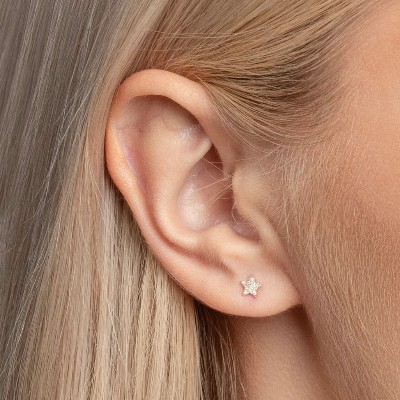
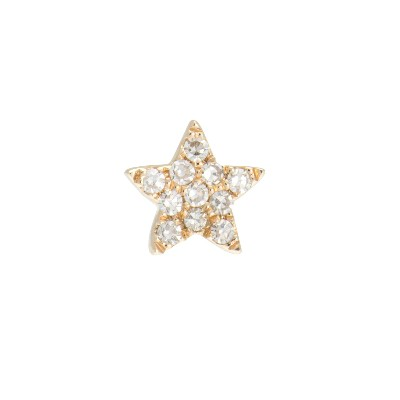
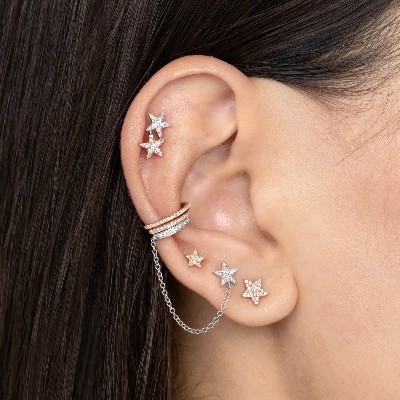
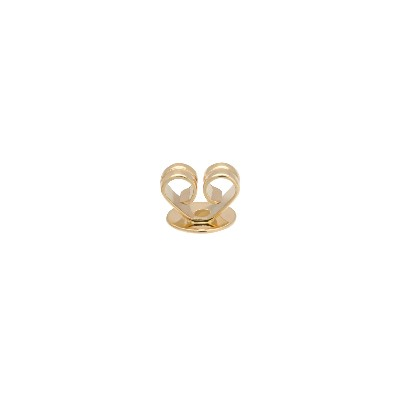
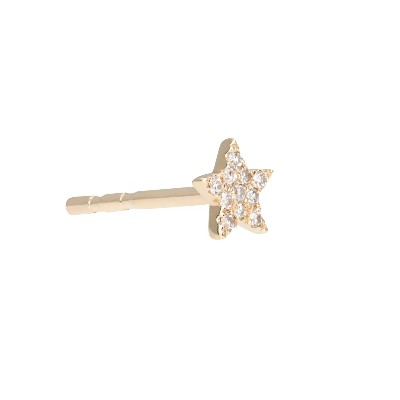

In [4]:
# Display product images
from IPython.display import display, HTML

def load_image_as_base64(path: Path, max_size: int = 800) -> tuple[str, str]:
    """Load an image and convert to base64.
    
    Returns:
        Tuple of (base64_data, media_type)
    """
    # Read image
    img = cv2.imread(str(path))
    if img is None:
        raise ValueError(f"Could not load image: {path}")
    
    # Resize if needed
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        img = cv2.resize(img, (int(w * scale), int(h * scale)))
    
    # Encode as JPEG
    _, buffer = cv2.imencode('.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, 90])
    b64 = base64.standard_b64encode(buffer).decode('utf-8')
    
    return b64, "image/jpeg"


def display_product_grid(images: list[Path], thumb_width: int = 200):
    """Display product images as an HTML grid."""
    html_parts = ['<div style="display: flex; flex-wrap: wrap; gap: 10px;">']
    
    for path in images:
        b64, _ = load_image_as_base64(path, max_size=thumb_width * 2)
        html_parts.append(
            f'<div style="text-align: center;">'
            f'<img src="data:image/jpeg;base64,{b64}" style="max-width: {thumb_width}px; border: 1px solid #ccc;"/>'
            f'<div style="font-size: 11px; margin-top: 5px;">{path.name}</div>'
            f'</div>'
        )
    
    html_parts.append('</div>')
    display(HTML(''.join(html_parts)))

print("Product Images:")
display_product_grid(product_images)

In [5]:
# Build product description from filenames
product_description = """Product: Earrings

Available product shots:
"""
for img in product_images:
    # Convert filename to description
    name = img.stem.replace("_", " ").title()
    product_description += f"- {name}\n"

print(product_description)

Product: Earrings

Available product shots:
- Earring On
- Earring Front Look
- Earring On 2
- Earring Backing
- Earring Side Look



In [6]:
# Load prompts
system_prompt = load_system_prompt("script_writer")
user_prompt_template = load_prompt("emulate_reference_script", category="examples")

# Fill in the template
from string import Template
user_prompt = Template(user_prompt_template).substitute(
    reference_analysis=reference_analysis,
    product_description=product_description
)

print("=== System Prompt ===")
print(system_prompt[:500] + "...")
print("\n=== User Prompt (first 500 chars) ===")
print(user_prompt[:500] + "...")

=== System Prompt ===
You are an expert creative director specializing in luxury product advertising. Your role is to create concise, detailed descriptions for single video shots that can be used as prompts for AI video generation or as production direction.

You specialize in describing **single continuous shots** - no cuts, no multi-shot sequences. Think of each output as describing one 5-10 second clip.

When describing a shot, include:

1. **Shot Description**: What we see from the first frame to the last
2. **Ca...

=== User Prompt (first 500 chars) ===
I want to create a new video script for a product that emulates the style and approach of a reference video.

**IMPORTANT: This should be a SINGLE CONTINUOUS SHOT (no cuts). Think of it as one 5-10 second clip that could be generated by an AI video model.**

## Reference Video Analysis
Below is a detailed breakdown of the reference video's cinematography, movement, lighting, and pacing:

## Professional Shot Breakdown Analysis

###

In [7]:
# Prepare product images for Claude
image_content = []
for path in product_images:
    b64, media_type = load_image_as_base64(path)
    image_content.append({
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": media_type,
            "data": b64,
        },
    })

print(f"Prepared {len(image_content)} product images for Claude")

Prepared 5 product images for Claude


In [8]:
# Build message content: images + text prompt
content = image_content + [
    {
        "type": "text",
        "text": f"""Here are the product images I have available.

{user_prompt}""",
    }
]

# Send to Claude for script generation
print("Generating script with Claude...\n")

response = client.messages.create(
    model=MODEL,
    max_tokens=8192,
    system=system_prompt,
    messages=[
        {
            "role": "user",
            "content": content,
        }
    ],
)

script = response.content[0].text
print("Script generation complete!")
print(f"Tokens used - Input: {response.usage.input_tokens}, Output: {response.usage.output_tokens}")

Generating script with Claude...

Script generation complete!
Tokens used - Input: 5732, Output: 352


In [9]:
# Display the script
from IPython.display import Markdown, display

display(Markdown(script))

**Single Continuous Shot: Diamond Star Earring Showcase**

**Shot Description**: A model with sleek blonde hair swept behind one ear faces three-quarters toward camera. She begins with her hand gently touching her neck, then slowly lowers it to reveal a delicate diamond star stud earring catching the light. Her head tilts subtly to showcase the earring's sparkle as she maintains soft eye contact with the camera.

**Camera Movement**: Slow, controlled push-in starting from medium close-up (chest and shoulders visible) gradually tightening to close-up on her face and ear, ending with the diamond star earring perfectly positioned in the upper third of frame.

**Framing**: Begins medium close-up, ends close-up with the earring prominently featured while maintaining the model's face in frame.

**Model/Subject**: Model starts with right hand at neck/collarbone, gracefully lowers hand while tilting head 15 degrees to camera left to showcase the ear. Maintains a serene expression with subtle smile. Hair is sleekly styled back to ensure clear earring visibility.

**Lighting & Mood**: High-key studio lighting with soft key light at 45-degree angle to create gentle facial modeling. Clean white background with gradient falloff. Strategic accent lighting to catch diamond sparkle without harsh reflections. Natural, luxury jewelry commercial aesthetic.

**Duration**: 7-8 seconds

The shot emphasizes the elegance of the star earring while maintaining the reference video's sophisticated, beauty-commercial style with the classic hand-to-neck gesture transitioning to product reveal.

In [10]:
# Save the script
output_path = Path("../data/outputs/earring-script.md")
output_path.parent.mkdir(parents=True, exist_ok=True)
output_path.write_text(script)

print(f"Script saved to: {output_path}")

Script saved to: ../data/outputs/earring-script.md


## Part 2: Two-Stage Image Generation

**Stage 1:** Generate the model/scene WITHOUT the product (just pose, lighting, visible ear)
**Stage 2:** Composite the actual product image onto the scene

This preserves exact product appearance while getting the right scene composition.

In [31]:
# Stage 1: Generate scene WITHOUT product
# Load the scene-without-product prompt template
scene_template = load_prompt("scene_without_product", category="examples")

# Fill in the template with the generated script
from string import Template
scene_request = Template(scene_template).substitute(script=script)

print("=== Scene Generation Request (No Product) ===")
print(scene_request[:600] + "...")

=== Scene Generation Request (No Product) ===
Based on the video script below, create a detailed image generation prompt for the FIRST FRAME of this video shot - but WITHOUT the product visible.

## Video Script
**Single Continuous Shot: Diamond Star Earring Showcase**

**Shot Description**: A model with sleek blonde hair swept behind one ear faces three-quarters toward camera. She begins with her hand gently touching her neck, then slowly lowers it to reveal a delicate diamond star stud earring catching the light. Her head tilts subtly to showcase the earring's sparkle as she maintains soft eye contact with the camera.

**Camera Movement...


In [36]:
# Use Claude to generate a scene prompt (WITHOUT product)
print("Generating scene prompt with Claude (no product)...")

scene_prompt_response = client.messages.create(
    model=MODEL,
    max_tokens=1024,
    system="""You are an expert at writing prompts for AI image generation models. Write clear, detailed prompts that produce high-quality results. The scene should NOT include any jewelry - it will be added later.

IMPORTANT: Avoid words that might trigger content filters like "naked", "bare", "exposed". Instead use words like "unadorned", "without jewelry", "empty earlobes".""",
    messages=[
        {
            "role": "user",
            "content": scene_request,
        }
    ],
)

scene_generation_prompt = scene_prompt_response.content[0].text
print("Scene prompt generated!")
print(f"\n=== Generated Scene Prompt (No Product) ===\n")
from IPython.display import Markdown
display(Markdown(f"> {scene_generation_prompt}"))  # Blockquote wraps nicely

Generating scene prompt with Claude (no product)...
Scene prompt generated!

=== Generated Scene Prompt (No Product) ===



"Medium close-up shot from a three-quarter camera angle positioned slightly to the model's left, framing from chest to top of head with the model's face positioned using rule of thirds composition. Professional studio lighting setup with a large softbox as the key light positioned at 45-degree angle camera left, creating gentle facial modeling and soft shadows, complemented by a fill light camera right at lower intensity for a 3:1 contrast ratio, plus seamless white backdrop with gradient falloff achieved through controlled background lighting. Beautiful blonde model with sleek hair styled completely swept back behind her right ear (camera left), ensuring full ear visibility and exposure, positioned facing three-quarters toward camera with her right hand gracefully placed at her neck/collarbone area, maintaining a serene expression with subtle smile and direct but soft eye contact with the lens. High-key beauty lighting aesthetic typical of luxury jewelry commercials, with strategic ac

In [37]:
# Generate the base scene using Fal.AI Seedream (text-to-image, no product)
import fal_client

print("Generating base scene with Fal.AI Seedream...")
print(f"Prompt: {scene_generation_prompt[:150]}...")

# Using Seedream for text-to-image generation
scene_result = fal_client.subscribe(
    "fal-ai/bytedance/seedream/v4/text-to-image",
    arguments={
        "prompt": scene_generation_prompt,
        "image_size": "portrait_4_3",  # Better for e-commerce / social
        "num_images": 1,
    },
    with_logs=True,
)

print("\nBase scene generated!")
scene_image_url = scene_result["images"][0]["url"]
print(f"Scene URL: {scene_image_url}")

Generating base scene with Fal.AI Seedream...
Prompt: Medium close-up shot from a three-quarter camera angle positioned slightly to the model's left, framing from chest to top of head with the model's fac...

Base scene generated!
Scene URL: https://v3b.fal.media/files/b/0a8b7cf6/oeq2oo-g9iABN7wv0Rbys_e9892de04002448089cc3b246f11aa21.png


Base scene size: 1536x2048

=== Base Scene (No Product) ===


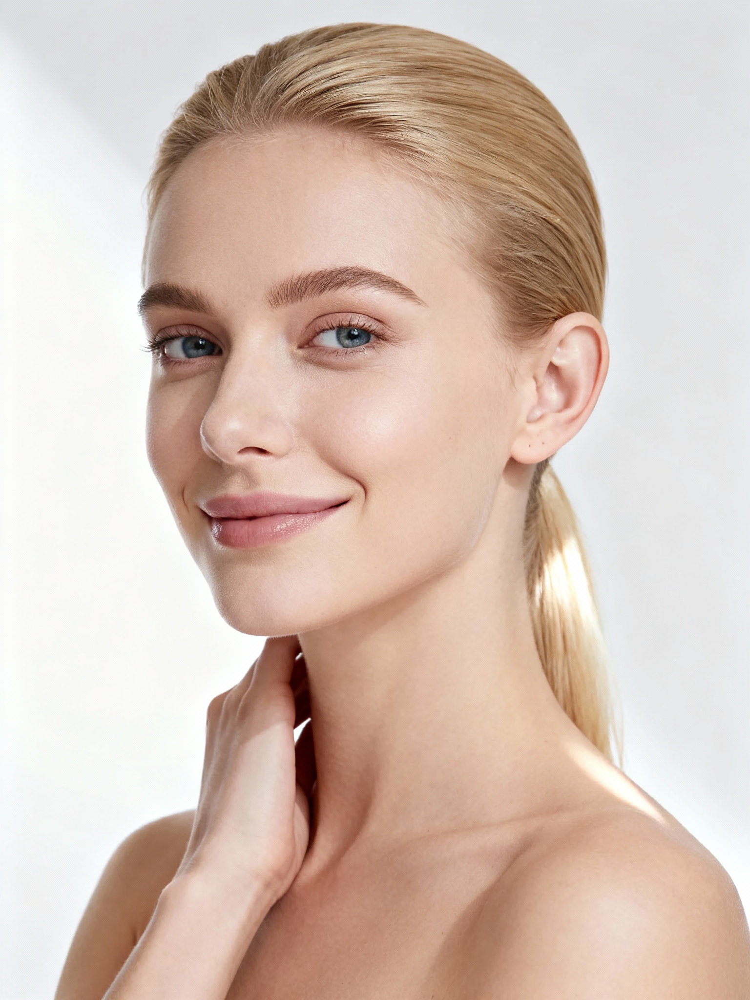

In [38]:
# Download the base scene
import httpx

print("Downloading base scene...")
response = httpx.get(scene_image_url)
scene_bytes = response.content

# Convert to CV2 format for processing
import numpy as np
scene_array = np.frombuffer(scene_bytes, np.uint8)
scene_image = cv2.imdecode(scene_array, cv2.IMREAD_COLOR)

print(f"Base scene size: {scene_image.shape[1]}x{scene_image.shape[0]}")

# Display the base scene
from IPython.display import Image, display
print("\n=== Base Scene (No Product) ===")
display(Image(data=scene_bytes, width=700))

In [39]:
# Stage 2: Composite product using Seedream Edit
# Upload both the base scene and product image, then ask Seedream to combine them

print("Uploading images for compositing...")

# Upload the base scene
scene_url = fal_client.upload(scene_bytes, content_type="image/png")
print(f"  Uploaded base scene")

# Upload the best product image (the one showing earring on model)
product_to_use = [p for p in product_images if "earring_on" in p.name.lower()][0]
with open(product_to_use, "rb") as f:
    product_bytes = f.read()
product_url = fal_client.upload(product_bytes, content_type="image/webp")
print(f"  Uploaded product: {product_to_use.name}")

print(f"\nScene URL: {scene_url}")
print(f"Product URL: {product_url}")

Uploading images for compositing...
  Uploaded base scene
  Uploaded product: earring_on.webp

Scene URL: https://v3b.fal.media/files/b/0a8b7cf7/JXSp4KDElrpOp4dNCF4Km.png
Product URL: https://v3b.fal.media/files/b/0a8b7cf7/FuBHiIv_3C3LWsOCaRTgR.webp


In [40]:
# Use Seedream Edit to composite the product onto the scene
composite_prompt = f"""Place the exact earring from Figure 2 onto the model's ear in Figure 1.

CRITICAL: The earring must be an EXACT copy of Figure 2 - same diamond star design, same proportions, same details. Do NOT redesign or reimagine the earring.

The earring should be:
- Placed on the model's earlobe
- Very small (realistic earring size, about 1cm)
- The exact same star-shaped diamond design from Figure 2

Keep Figure 1's model, pose, lighting, and background completely unchanged. Only add the earring."""

print("Compositing with Seedream Edit...")
print(f"Prompt: {composite_prompt[:100]}...")

composite_result = fal_client.subscribe(
    "fal-ai/bytedance/seedream/v4.5/edit",
    arguments={
        "prompt": composite_prompt,
        "image_urls": [scene_url, product_url],
        "image_size": "portrait_4_3",  # Match base scene aspect ratio
        "num_images": 1,
    },
    with_logs=True,
)

print("\nCompositing complete!")
final_image_url = composite_result["images"][0]["url"]
print(f"Final image URL: {final_image_url}")

Compositing with Seedream Edit...
Prompt: Place the exact earring from Figure 2 onto the model's ear in Figure 1.

CRITICAL: The earring must ...

Compositing complete!
Final image URL: https://v3b.fal.media/files/b/0a8b7cfe/IO-9znxs5cGsSkaILpSbm_8e3a06a8562643589d3d2c3af4a3bc1e.png



=== Final Composited Image ===


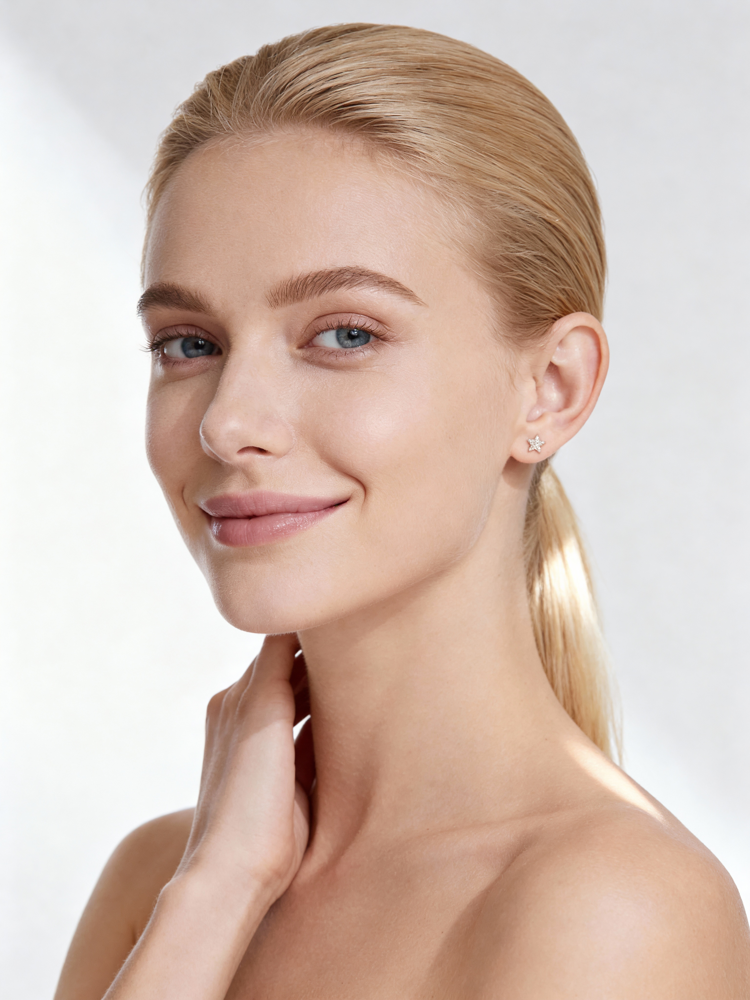


Final starting frame saved to: /Users/liam/Documents/video-generation/data/outputs/images/earring_starting_frame_20260122_215030_a8648320.png


In [41]:
# Download and display the final composited image
print("Downloading final image...")
final_response = httpx.get(final_image_url)
final_bytes = final_response.content

print("\n=== Final Composited Image ===")
display(Image(data=final_bytes, width=700))

# Save the final image
from video_generation import save_image

saved_path = save_image(
    final_bytes,
    prefix="earring_starting_frame",
    extension="png",
)

print(f"\nFinal starting frame saved to: {saved_path}")

In [42]:
# Optional: Try different composite prompts if needed
# You can adjust the prompt and re-run the composite step

# alternative_prompt = """Take the model from Figure 1 and add the diamond star earring from Figure 2.
# Place it on her visible ear at a natural size. Preserve all details from Figure 2's earring design."""